<a href="https://colab.research.google.com/github/kforero17/coast2coast/blob/main/Modeling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error,  r2_score
from sklearn.svm import SVR
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive
drive.mount('/content/drive/', force_remount=True)
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.pipeline import make_pipeline
import plotly.express as ex
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from sklearn.metrics import accuracy_score 
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBRegressor
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, SimpleRNN
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor


Mounted at /content/drive/


In [3]:
file_path = '/content/drive/MyDrive/Capstone_498_EV/Data/final_updated.csv'

In [4]:
final_df = pd.read_csv(file_path)

In [5]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1265 entries, 0 to 1264
Data columns (total 33 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Unnamed: 0                          1265 non-null   int64  
 1   County                              1265 non-null   object 
 2   City                                1265 non-null   object 
 3   Zip Code                            1265 non-null   int64  
 4   Station Name                        1265 non-null   object 
 5   Street Address                      1265 non-null   object 
 6   Total Charging Ports                1265 non-null   float64
 7   Level1 Ports                        1265 non-null   float64
 8   Level2 Ports                        1265 non-null   float64
 9   DC Fast Ports                       1265 non-null   float64
 10  Latitude                            1265 non-null   float64
 11  Longitude                           1265 no

In [6]:
final_df = final_df.drop(columns = ['Unnamed: 0', 'County', 'City', 'Zip Code', 'ROAD_NAME', 'EV Connector Types'])

In [7]:
final_df['Ports by Income'] = final_df['Level2 Ports']+ final_df['DC Fast Ports']/final_df['Median Household Income']

In [8]:
final_df['Ports by AADT'] = final_df['Level2 Ports']+ final_df['DC Fast Ports']*final_df['Annual Average Daily Traffic']

In [9]:
final_df['AADT by Housing Density'] = final_df['Total Housing Unit Density']*final_df['Annual Average Daily Traffic']

In [10]:
final_df['EV_Count_Port_Density'] = final_df['Level2 Ports']+ final_df['DC Fast Ports']/ final_df['EV_Count']

In [11]:
final_df[final_df.columns[1:]].corr()['Total Charging Ports'][:]

<ipython-input-11-0ab263e81ff9>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  final_df[final_df.columns[1:]].corr()['Total Charging Ports'][:]


Total Charging Ports                  1.000000
Level1 Ports                          0.372954
Level2 Ports                          0.411719
DC Fast Ports                         0.673300
Latitude                              0.014643
Longitude                             0.032877
Labor Force                           0.032813
Employed Population                   0.032849
Unemployed Population                 0.032258
Unemployment Rate                     0.014962
Median Household Income               0.029243
Median Household Income % of State    0.029313
Population                            0.032760
Population Density                    0.038985
% of Minority Pop                     0.026793
% of Black Pop                        0.006080
% of Hispanic Pop                     0.020550
Total Housing Units                   0.032725
Occupied Housing Units                0.032702
Vacant Housing Units                  0.032968
Total Housing Unit Density            0.038323
Annual Averag

In [12]:
categorical_columns = ['Facility Type']
final_df = pd.get_dummies(final_df, columns=categorical_columns)


In [13]:
final_df['EV_Count_Port_Density'] = final_df['EV_Count_Port_Density'].fillna(final_df['EV_Count_Port_Density'].median())

In [14]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1265 entries, 0 to 1264
Data columns (total 71 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Station Name                             1265 non-null   object 
 1   Street Address                           1265 non-null   object 
 2   Total Charging Ports                     1265 non-null   float64
 3   Level1 Ports                             1265 non-null   float64
 4   Level2 Ports                             1265 non-null   float64
 5   DC Fast Ports                            1265 non-null   float64
 6   Latitude                                 1265 non-null   float64
 7   Longitude                                1265 non-null   float64
 8   Labor Force                              1265 non-null   float64
 9   Employed Population                      1265 non-null   float64
 10  Unemployed Population                    1265 no

In [15]:
X = final_df.drop(['Station Name', 'Street Address', 'Total Charging Ports', 'Level1 Ports', 'Level2 Ports', 'DC Fast Ports'], axis=1)
y = final_df['Total Charging Ports']

In [16]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [17]:
# Scale train and test sets with StandardScaler
X_train_std = StandardScaler().fit_transform(X_train)
X_test_std = StandardScaler().fit_transform(X_test)

# Fix the dimensions of the target array
y_train = y_train.values.reshape(-1, 1)
y_test = y_test.values.reshape(-1, 1)

In [ ]:
# Train the random forest model
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train_std, y_train)

# Make predictions
y_pred = rf.predict(X_test_std)

<ipython-input-18-7f748fac8191>:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf.fit(X_train_std, y_train)


In [ ]:
# Calculate the mean squared error
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

Mean Squared Error: 4.473791842105263
R-squared: 0.035928639542987306


In [ ]:
# Calculate feature importances
feature_importances = rf.feature_importances_


In [ ]:
pd.DataFrame(
    zip(X_train.columns, abs(feature_importances)),
    columns=["feature", "weight"],
).sort_values("weight").reset_index(drop=True)

,feature,weight
0,Facility Type_MUNI_GOV,0.000000
1,Facility Type_COLLEGE_CAMPUS,0.000000
2,Facility Type_CARWASH,0.000000
3,Facility Type_BREWERY_DISTILLERY_WINERY,0.000000
4,Facility Type_BANK,0.000000
...,...,...
60,Facility Type_GAS_STATION,0.005968
61,Latitude,0.015005
62,EV_Count_Port_Density,0.172121
63,Ports by Income,0.319834


In [ ]:
# Perform cross-validation
cv_scores = cross_val_score(rf, X, y, cv=5, scoring='neg_mean_squared_error')
print(f'Cross-Validation Mean Squared Error: {-np.mean(cv_scores)}')

Cross-Validation Mean Squared Error: 4.06014013750549


***SVM Model***

In [18]:
svm = SVR(kernel='linear')
svm.fit(X_train_std, y_train)


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVR(kernel='linear')

In [19]:
# Make predictions
y_pred = svm.predict(X_test_std)

In [20]:
# Calculate the mean squared error and R-squared
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

Mean Squared Error: 3.2397614182671908
R-squared: 0.3018537052463286


Text(0.5, 1.0, 'Actual vs Predicted Ports')

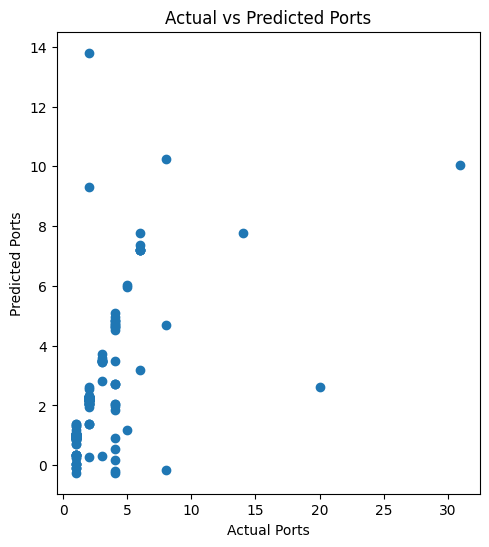

In [21]:
# Scatter plot
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.scatter(y_test, y_pred)
plt.xlabel("Actual Ports")
plt.ylabel("Predicted Ports")
plt.title("Actual vs Predicted Ports")

***XGB Model***

In [ ]:
xgb = XGBRegressor()

In [ ]:
# Define the parameter grid for hyperparameter tuning
param_grid = {
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 5, 7],
    'min_child_weight': [1, 3],
    'subsample': [0.5, 0.7],
    'colsample_bytree': [0.5, 0.7],
    'n_estimators': [100, 200],
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search.fit(X_train_std, y_train)


GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None, gpu_id=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None, n_estimators=100,
                                    n_jobs=None, num_parallel_tree=None,
                                    predictor=None, random_state=None, ...),
             n_jobs=-1,
             param_grid={'colsample_bytree': [0.5, 0.7],
                         'learning_rate': [0.01, 0.1], 'max_depth': [3, 5, 7],
                         'min_child_weight': [1, 3], 'n_estimators': [100, 200],
                         'subsample': [0.5, 0.7]},
             scoring='neg_mean_squared_error')

In [ ]:
print(f"Best hyperparameters: {grid_search.best_params_}")

Best hyperparameters: {'colsample_bytree': 0.5, 'learning_rate': 0.1, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 200, 'subsample': 0.7}


In [ ]:
# Train the XGBoost model using the best hyperparameters
best_xgb = grid_search.best_estimator_
best_xgb.fit(X_train_std, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.5, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=1, missing=nan, monotone_constraints=None,
             n_estimators=200, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [ ]:
# Make predictions
y_pred = best_xgb.predict(X_test_std)

# Calculate the mean squared error
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Squared Error: {mse}")
print(f'R-squared: {r2}')

Mean Squared Error: 3.5432280321657172
R-squared: 0.23645873792555094


**RNN Model**

In [ ]:
# Reshape input to be 3D [samples, timesteps, features]
scaler = StandardScaler()
X = scaler.fit_transform(X)
X = X.reshape(X.shape[0], 1, X.shape[1])


In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [ ]:
# Create a function to build the RNN model
def create_rnn_model(learning_rate=0.01, rnn_units=50):
    model = Sequential()
    model.add(SimpleRNN(units=rnn_units, input_shape=(X_train.shape[1], X_train.shape[2]), activation='relu'))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mean_squared_error')
    return model

In [ ]:
# Create a KerasRegressor wrapper for the RNN model
rnn_model = KerasRegressor(build_fn=create_rnn_model, verbose=0)

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'learning_rate': [0.001, 0.01],
    'rnn_units': [30, 50],
    'batch_size': [16, 32],
    'epochs': [50, 100],
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=rnn_model, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Print the best hyperparameters
print(f"Best hyperparameters: {grid_search.best_params_}")

<ipython-input-44-8455480702f1>:2: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  rnn_model = KerasRegressor(build_fn=create_rnn_model, verbose=0)


Best hyperparameters: {'batch_size': 32, 'epochs': 100, 'learning_rate': 0.001, 'rnn_units': 30}


In [ ]:
# Train the RNN model using the best hyperparameters
best_rnn = grid_search.best_estimator_
best_rnn.fit(X_train, y_train)

# Make predictions
y_pred = best_rnn.predict(X_test)

In [ ]:
# Calculate the mean squared error and R-squared
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 10.396991994201736
R-squared: -1.240480239195469


***Predicting Demand at Potential Locations***

In [22]:
file_path1 = '/content/drive/MyDrive/Capstone_498_EV/Data/parking_model.csv'

In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1265 entries, 0 to 1264
Data columns (total 65 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Latitude                                 1265 non-null   float64
 1   Longitude                                1265 non-null   float64
 2   Labor Force                              1265 non-null   float64
 3   Employed Population                      1265 non-null   float64
 4   Unemployed Population                    1265 non-null   float64
 5   Unemployment Rate                        1265 non-null   float64
 6   Median Household Income                  1265 non-null   float64
 7   Median Household Income % of State       1265 non-null   float64
 8   Population                               1265 non-null   float64
 9   Population Density                       1265 non-null   float64
 10  % of Minority Pop                        1265 no

In [23]:
locations = pd.read_csv(file_path1)

In [24]:
locations = locations.drop(columns = 'Unnamed: 0')

In [25]:
categorical_columns = ['Facility Type']
locations = pd.get_dummies(locations, columns=categorical_columns)


In [26]:
locations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25997 entries, 0 to 25996
Data columns (total 57 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   latitude                                 25997 non-null  float64
 1   longitude                                25997 non-null  float64
 2   cluster                                  25997 non-null  int64  
 3   Latitude                                 25997 non-null  float64
 4   Longitude                                25997 non-null  float64
 5   Labor Force                              25997 non-null  float64
 6   Employed Population                      25997 non-null  float64
 7   Unemployed Population                    25997 non-null  float64
 8   Unemployment Rate                        25997 non-null  float64
 9   Median Household Income                  25997 non-null  float64
 10  Median Household Income % of State       25997

In [27]:
locations['Facility Type_ARENA'] = 0
locations['Facility Type_BANK'] = 0
locations['Facility Type_FACTORY'] = 0
locations['Facility Type_FIRE_STATION'] = 0
locations['Facility Type_MUSEUM'] = 0
locations['Facility Type_FACTORY'] = 0
locations['Facility Type_PUBLIC'] = 0
locations['Facility Type_REC_SPORTS_FACILITY'] = 0
locations['Facility Type_RESEARCH_CENTER'] = 0

In [ ]:
locations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25997 entries, 0 to 25996
Data columns (total 65 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   latitude                                 25997 non-null  float64
 1   longitude                                25997 non-null  float64
 2   cluster                                  25997 non-null  int64  
 3   Latitude                                 25997 non-null  float64
 4   Longitude                                25997 non-null  float64
 5   Labor Force                              25997 non-null  float64
 6   Employed Population                      25997 non-null  float64
 7   Unemployed Population                    25997 non-null  float64
 8   Unemployment Rate                        25997 non-null  float64
 9   Median Household Income                  25997 non-null  float64
 10  Median Household Income % of State       25997

In [28]:
locations_std = StandardScaler().fit_transform(locations)

In [29]:
predicted_demand = svm.predict(locations_std)

In [30]:
locations['predicted_demand'] = predicted_demand

In [31]:
locations['predicted_demand'].head(25)

0     1.323781
1     1.277828
2     2.055511
3     0.598723
4     1.956816
5     1.320533
6     1.320540
7     1.320539
8     1.321050
9     1.320866
10    1.320866
11    1.178667
12    1.178669
13    1.178670
14    1.178678
15    1.178666
16    1.178671
17    1.178669
18    1.178664
19    1.334262
20    1.334262
21    2.921001
22    3.637345
23    3.637340
24    1.192095
Name: predicted_demand, dtype: float64

In [32]:
locations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25997 entries, 0 to 25996
Data columns (total 66 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   latitude                                 25997 non-null  float64
 1   longitude                                25997 non-null  float64
 2   cluster                                  25997 non-null  int64  
 3   Latitude                                 25997 non-null  float64
 4   Longitude                                25997 non-null  float64
 5   Labor Force                              25997 non-null  float64
 6   Employed Population                      25997 non-null  float64
 7   Unemployed Population                    25997 non-null  float64
 8   Unemployment Rate                        25997 non-null  float64
 9   Median Household Income                  25997 non-null  float64
 10  Median Household Income % of State       25997

In [33]:
pip install pulp

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.3/14.3 MB 59.2 MB/s eta 0:00:00


In [45]:
from pulp import LpMaximize, LpProblem, LpStatus, lpSum, LpVariable

# Create the model
model = LpProblem(name="optimal-charging-location", sense=LpMaximize)

# Initialize the decision variables
x = LpVariable.dicts("x", list(zip(locations['latitude'], locations['longitude'])), cat='Binary')
level2_ports = LpVariable("level2_ports", lowBound=0, cat='Integer')
dc_fast_ports = LpVariable("dc_fast_ports", lowBound=0, cat='Integer')

# Define the objective function
model += lpSum([x[lat, lon] * demand for (lat, lon), demand in zip(list(zip(locations['latitude'], locations['longitude'])), locations['predicted_demand'])])

# Add constraints
# at least 6 Level2 ports and 2 DC Fast ports per station
for lat, lon in zip(locations['latitude'], locations['longitude']):
    model += 6 * x[lat, lon] <= level2_ports
    model += 2 * x[lat, lon] <= dc_fast_ports

# Total ports must be at least 35000
model += level2_ports + dc_fast_ports >= 35000

# Level2 ports should be 85% of the total ports
model += level2_ports >= 0.85 * (level2_ports + dc_fast_ports)

# DC Fast ports should be 15% of the total ports
model += dc_fast_ports >= 0.15 * (level2_ports + dc_fast_ports)

# Total stations cannot exceed 10000
model += lpSum([x[lat, lon] for lat, lon in zip(locations['latitude'], locations['longitude'])]) <= 10000

# Solve the problem
status = model.solve()

# Print the results
print(f"status: {model.status}, {LpStatus[model.status]}")
print(f"objective: {model.objective.value()}")
print(f"Total Level2 ports: {level2_ports.varValue}")
print(f"Total DC Fast ports: {dc_fast_ports.varValue}")


status: 1, Optimal
objective: 33748.18896562787
Total Level2 ports: 29750.0
Total DC Fast ports: 5250.0


In [47]:
pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 16.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 13.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 64.3 MB/s eta 0:00:00


In [50]:
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster

# Create a DataFrame with the locations of the new charging stations
new_stations = [(lat, lon) for (lat, lon) in zip(locations['latitude'], locations['longitude']) if x[lat, lon].varValue > 0]
new_stations_df = pd.DataFrame(new_stations, columns=['latitude', 'longitude'])

# Add the number of Level2 and DC Fast ports to the DataFrame
new_stations_df['level2_ports'] = [6 * x[lat, lon].varValue for (lat, lon) in new_stations]
new_stations_df['dc_fast_ports'] = [2 * x[lat, lon].varValue for (lat, lon) in new_stations]


# Convert the DataFrame to a GeoDataFrame
gdf = gpd.GeoDataFrame(new_stations_df, geometry=gpd.points_from_xy(new_stations_df.longitude, new_stations_df.latitude))

# Create a map
m = folium.Map(location=[gdf['latitude'].mean(), gdf['longitude'].mean()], zoom_start=10)

# Add a marker for each charging station
marker_cluster = MarkerCluster().add_to(m)

for idx, row in gdf.iterrows():
    folium.Marker([row['latitude'], row['longitude']], 
                  popup=f"Level2 ports: {row['level2_ports']}<br>DC Fast ports: {row['dc_fast_ports']}"
                 ).add_to(marker_cluster)

# Display the map
m
